<a href="https://colab.research.google.com/github/Firoz-210594/Learnings/blob/main/RevisonNotes_Reg%2BKFold.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Content
  - Regularization
  - **Hyperparameter**
    - Hyperparameter tuning

  - **Cross Validation**
    - K-Fold cv

Logistic Regression 1:
**Introduction to Logistic Regression**
 - Will Linear Regression Work for Churn Prediction ?
 - How is Logistic Regression different from Linear Regression ?
 - Can you see a problem between $w^Tx_i+w_0$ and $y_i$ ?

# **Regularization**

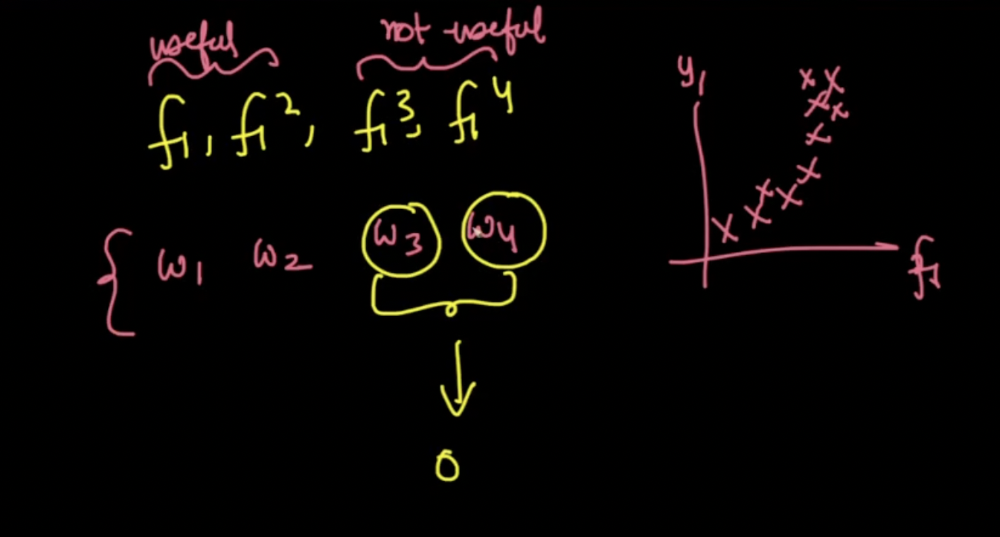

Imagine we have
- data in shape of quadratic curve
- 4 features i.e. $f_1, f_1^2, f_1^3, f_1^4$

#### How to avoid overfitting ?

If we don't want to overfit, we should force $w_3, w_4$ to zero.


#### How to achieve it mathematically?

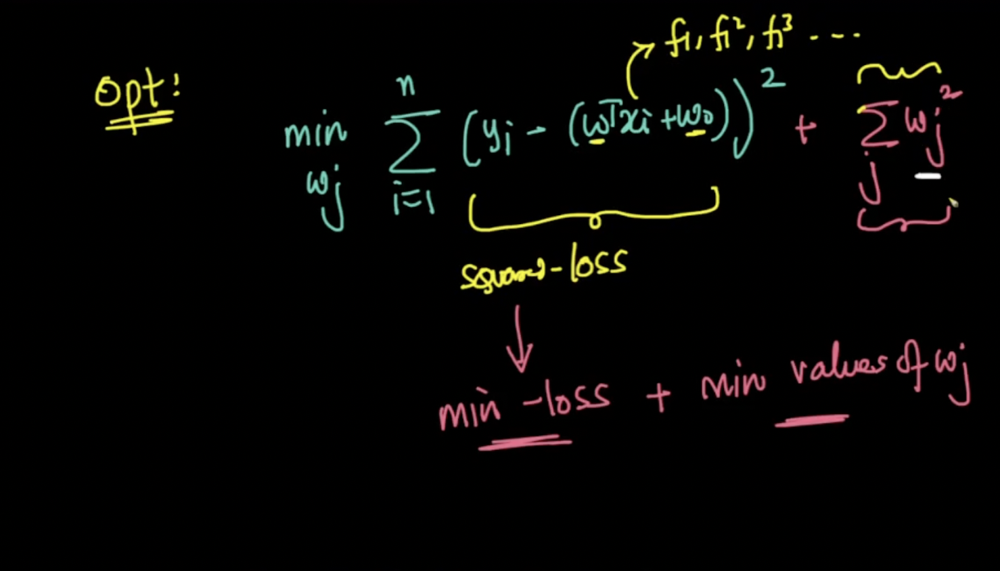

- We have an optmization equation which minimizes the squared loss
- We want some control over $w_j$'s so as to minimize weights of higher order features


#### **How can we achieve the control on weights?**
We add a term $\sum w_j^2$ to our optimization equation

Idea is:
- We don't $w_j$ values to be large for useless features.
- In addition ot mimimizing loss, minimize values of  $w_j$ as well

This is called as **regularization**

## **But, how do control the regularization ?**


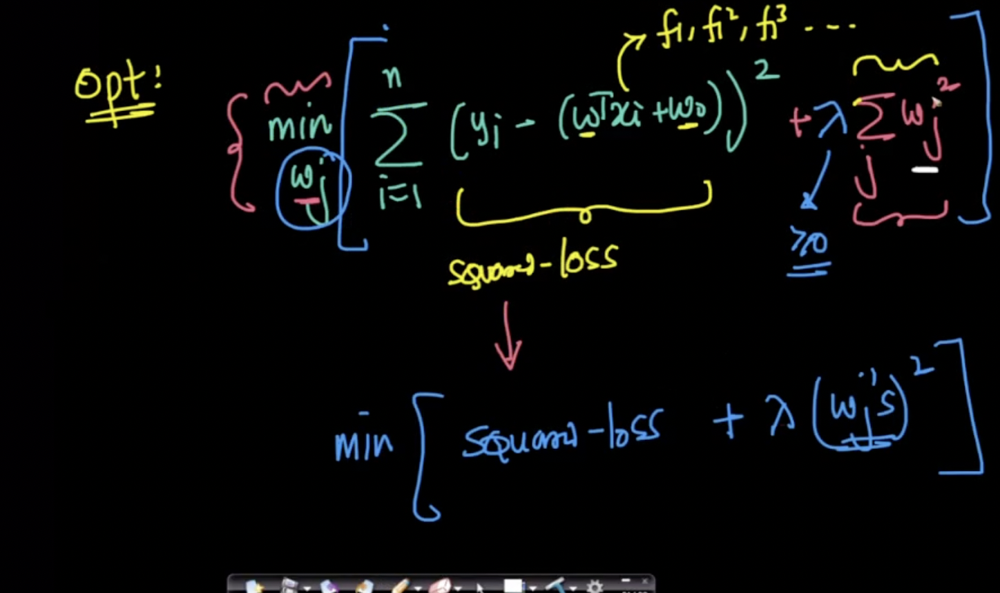

- We introduce a term $\lambda$ ($\geq 0$ ) which is multiplied with the regularization term ($\sum w_j^2$).
- The optimization equation becomes minimization of [squared loss and regularization term]




#### **How is regularization working?**

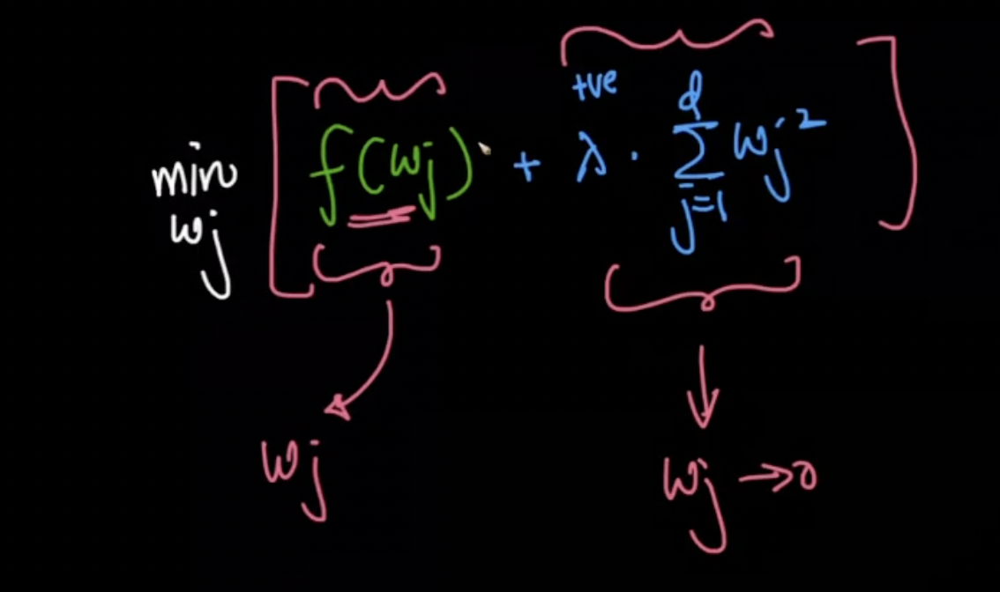

Now, we have two parts to optimization equation
  1. Loss term
  2. Regularization term

There is a tussle between the two parts
- Loss terms wants such $w_j$ which reduces the squared loss.
- Regularization term wants to reduce $w_j$ to 0.

At one point, it'll reach good tradeoff where it'll get $w_j$ which reduces the loss term and reduces $w_j$ to zero for useless features.

#### **Why does regularization only make useless feature zero?**

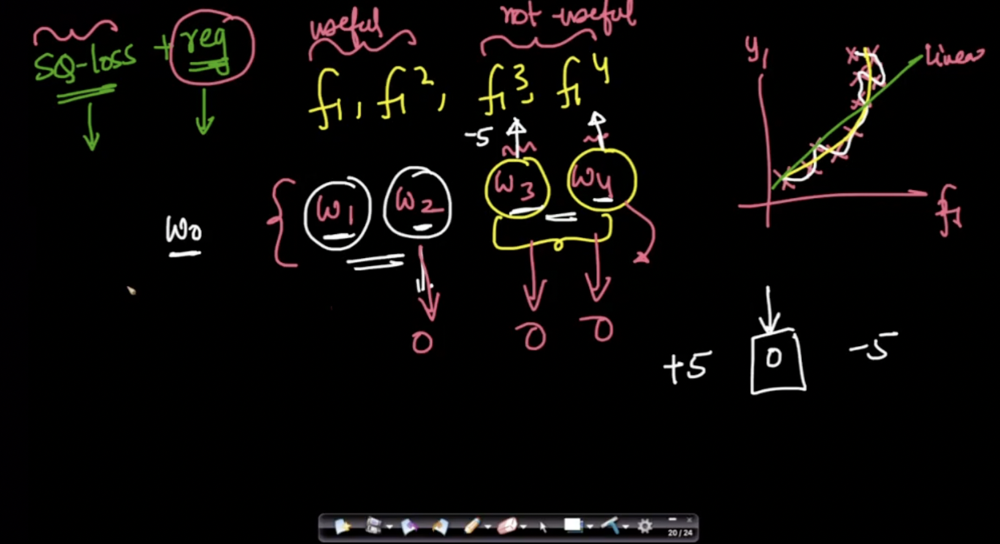

In order to minimize optimization equation, we need to minimize both
- squared loss
- regulariation term

Imagine a case where
- $w_2 = w_3 = w_4 = 0$

**What happens in this case?**
- The regularization term is happy as weights are tending to 0
- The loss term is unhappy as it is unable to fit data perfectly (only $w_1 \neq 0$, hence straight line) over quadratic data

Ther has to be balance or trade off between loss and regularization. You can't put too much pressure on one term.

If regularization makes useful feature ($f_1^2$ in this case) tend to 0
- Loss will increase
- Increase in loss term means it is not optimal solution anymore.




## **Why square of $w_j$ for regularization ?**

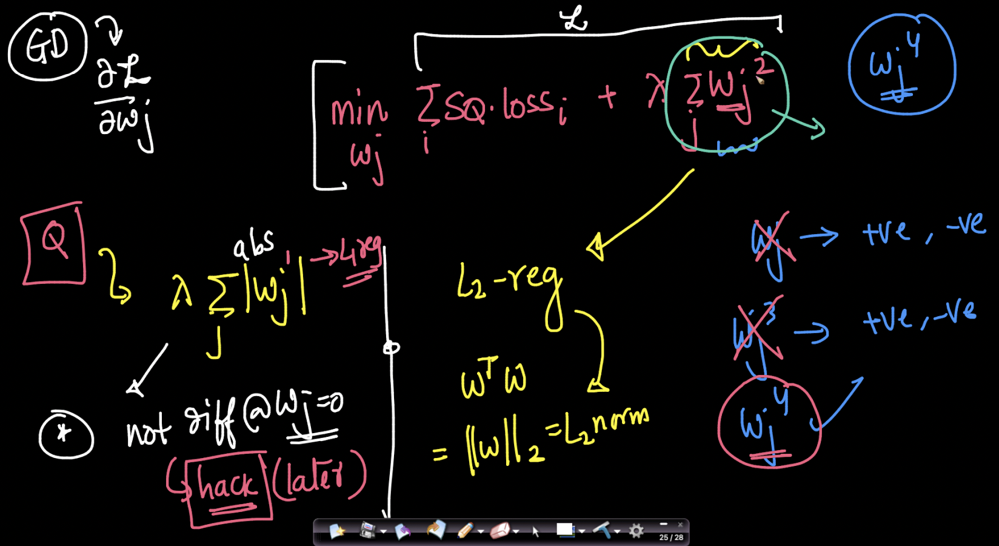

Regularization wants to reduce $w_j$ to 0 by still making the Loss function differentiable

If we take regularization term as
- Case1: $w_j$
  - $w_j$ can be both +ve/-ve
  - This will encourage all $w_j$ to be -ve (to minimize the optimization equation)

- Case2: $w_j^3$
  - Cube term can be both +ve/-ve
  - Same issue as faced in Case1

- Case3: $w_j^4$
  - Can be used.

Here, $w_j^2$ is called **L2- regularization** or **Rigde regularization** or **Tekhonov regularization**



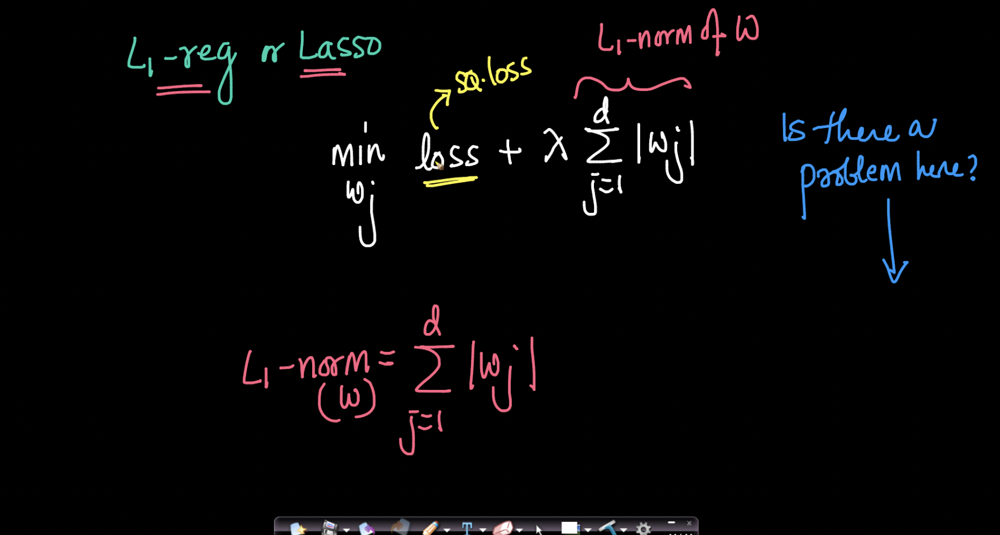

#### Question: What other functions of w can we use ?

Ans: Absolute value of $w_j$ ($|w_j|$). It is also called **L1- regularization** or **Lasso regularization.**



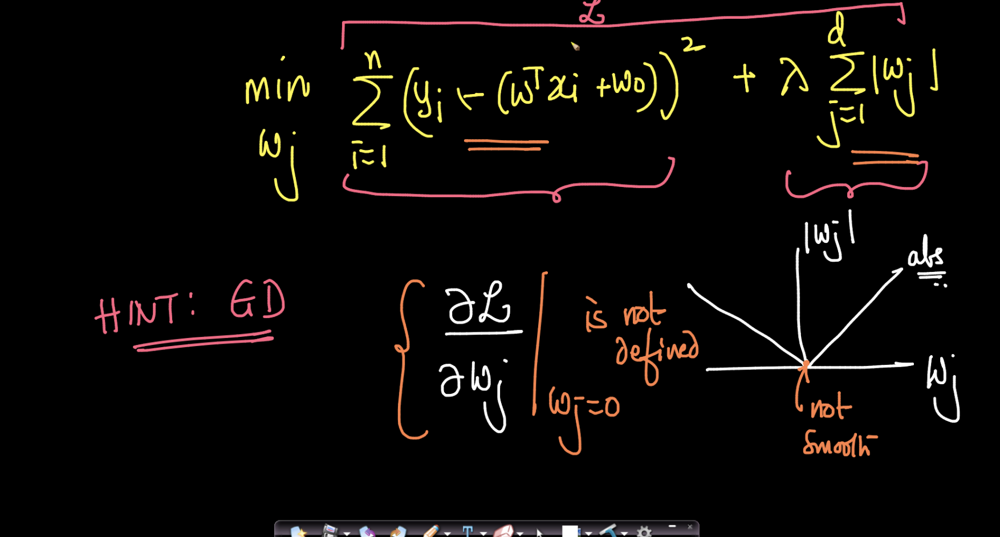

#### What is the issue with $|w_j|$ ?
- In optimization problem, we'll have to differentiate whole optimization equation w.r.t $w_j$.

- $|w_j|$ is not differentiable at w = 0.



#### **How to fix it ?**

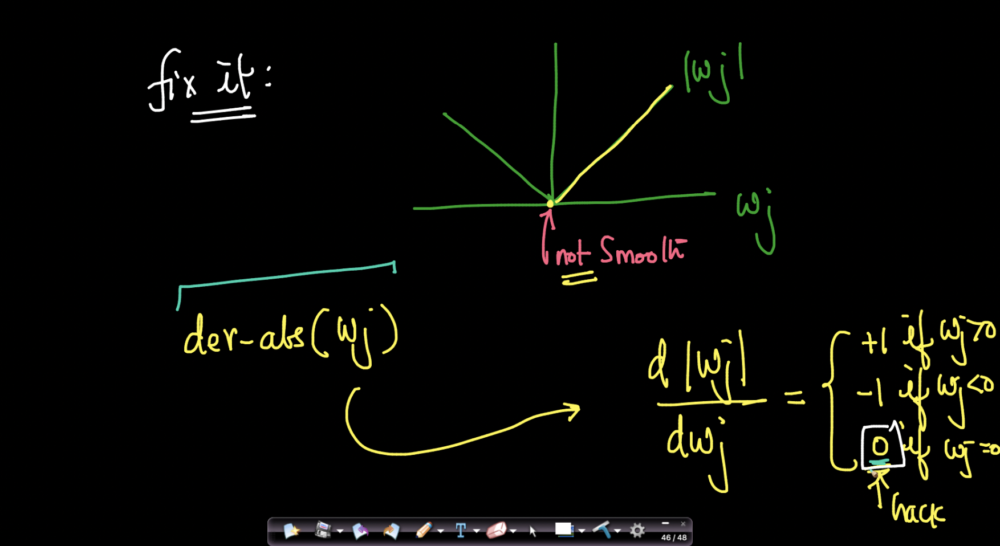

We use a small hack to compute the derivative
- Derivative $d |w_j|/ dw_j$ will be
  - +1 if $w_j > 0$
  - -1 if $w_j < 0$
  - <font color = 'red'> 0 if $w_j = 0$</font>

## **Why are we making derivative 0 when $w_j = 0$ ? (FAANG like interview question)**



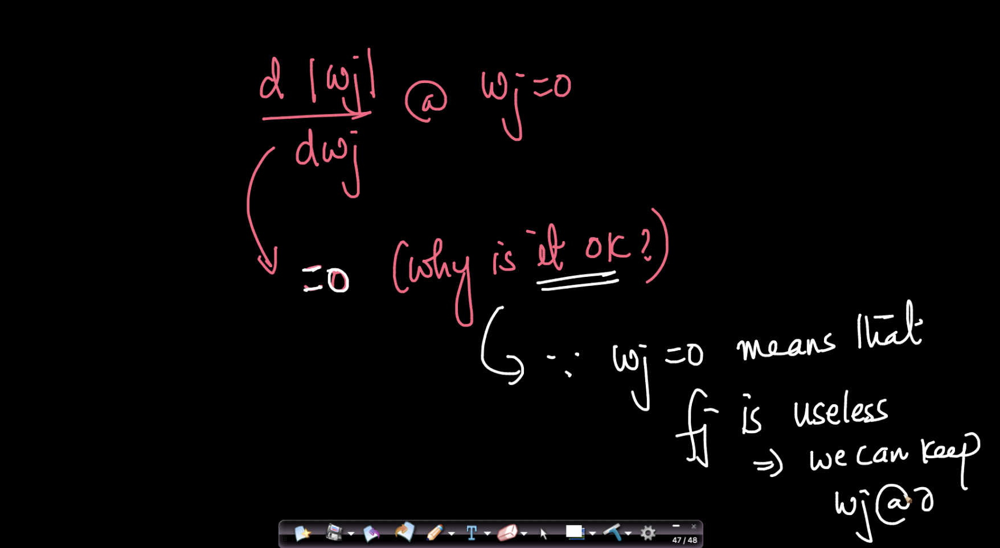

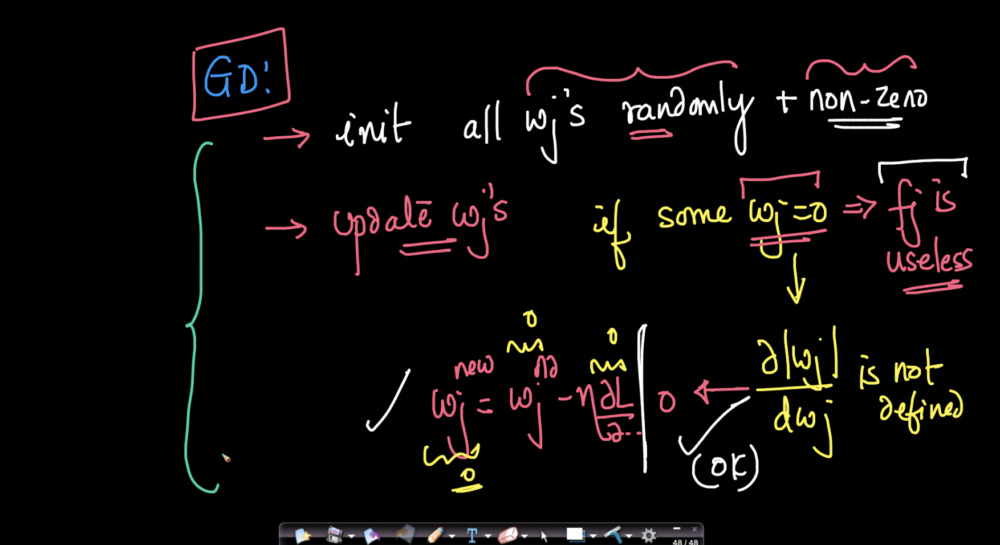

In Gradient Descent
- Initially, we initialize all $w_j$'s non zero randomly.
- then we update the $w_j$'s

Now, after update if $w_j = 0$, it means $f_j$ is useless.

If we define derivite = 0, it won't impact the update and hence it is fine.



## **Interesting property of L1- regularization**

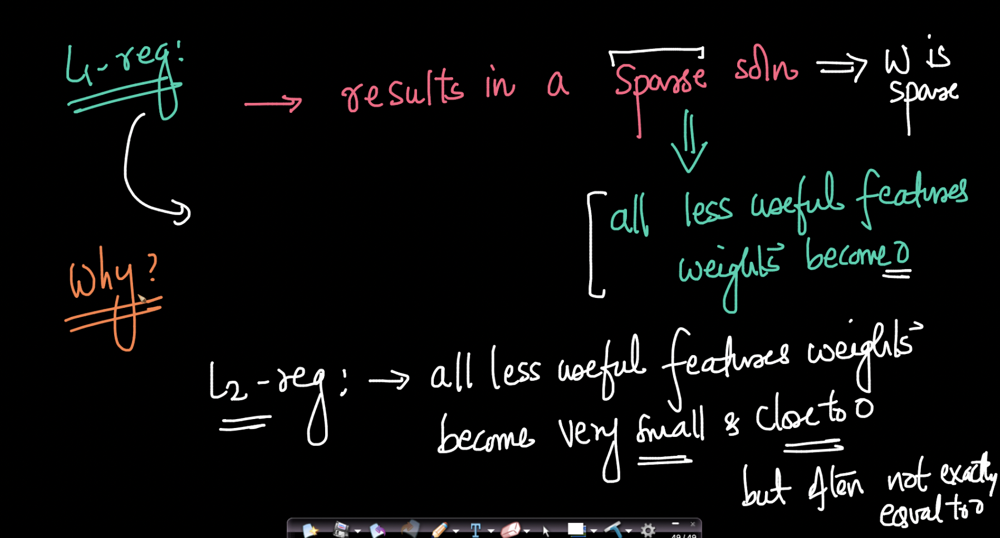

L1 regularization results in sparse solution

#### What does sparse solution mean?

- It means that weight vector ($w$) will be sparse.
- All less useful / useless feature weights will be zero

However, in L2 regularization, all less useful feature weights become very small but often not exactly equal to 0.



#### **Why L1 regularization push useless feature weights to 0? (Geometric intuition)**

timstamp: Misc topics - 1 - 2:26:30

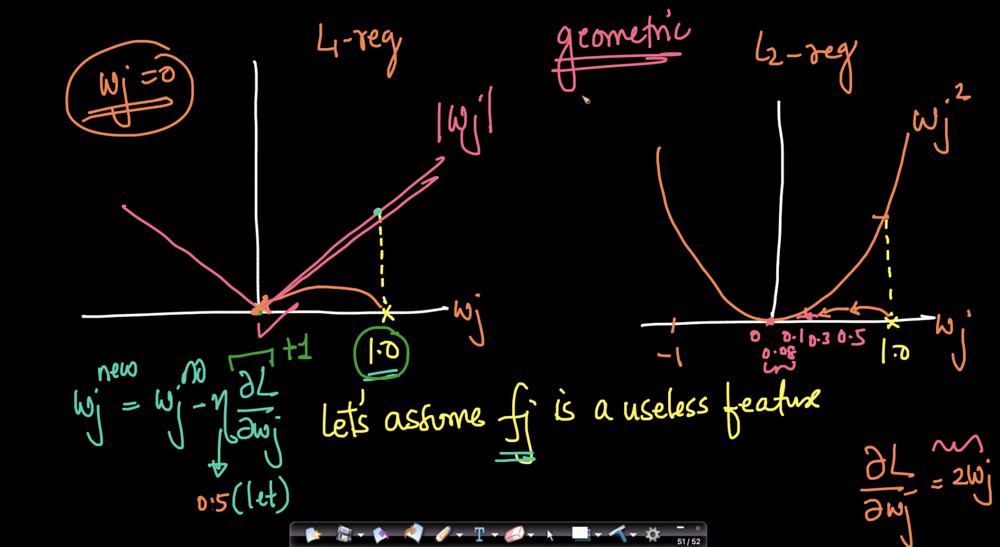

Optimization consists of 2 parts
- loss term
- regularization term

####Assumptions:
- Let's assume $f_j$ is a useless feature such that $w_j$ for this feature is 1.0

- Since, it is a useless feature, it won't contribute to loss term

- Assume the optimization equation has only regularization term (Ignore loss term for now)

#### What will be the gradients ?

- Now, the gradient for L1 regularization ($|w_j|$) is +1 (as $w_j$ is positive) (independent of $w_j$)

- The gradient for L2 reg. is $2w_j$ (gradient is dependent on value of $w_j$)


#### What is the update equation?

Update equation: $w_j^{new} = w_j^{old} - \eta . dL / dw_j$






Now, Let's assume $w_j = 0.9$ and learning rate,η = 0.2

**For update in L1 regularization**,
- $w_j^{new} = 0.9 - 0.2*1 = 0.7$

On 2nd Iteration
- $w_j^{new} = 0.7 - 0.2*1 = 0.5$

On 3rd Iteration
- $w_j^{new} = 0.5 - 0.2*1 = 0.3$

- After few iterations, $w_j^{new}$ will become zero
- constant value is being subtracted in each iteration (as gradient is a constant value)

But, **for update in L2**
- Since the value of gradient is dependent of $w_j$ (grad = $2w_j$)
- As the value of $w_j$ decreases, the value of gradient also decreases
- 1st iteration: $w_j^{new} = 0.9 - 0.2*2*0.9= 0.9 - 0.36 = 0.54$
- 2nd iteration: $w_j^{new} = 0.54 - 0.2*2*0.54 = 0.54 - 0.21 = 0.33$
- 3rd iteration: $w_j^{new} = 0.33 - 0.2*2*0.33 = 0.33 - 0.13 = 0.20$
- and so on...

**Notice that as $w_j$ approaches 0, the gradient keeps getting smaller (0.54, 0.33, 0.20) as it is function of $w_j$**

- Hence, in L2 regularization, as $w_j → 0$, gradient keeps getting smaller and $w_j$ never reaches 0.
- Unlike in L1, where a constant value is subtracted in each iteration irrespective of value of w.

## **Advantages and Disadvantages of L1 regularization**

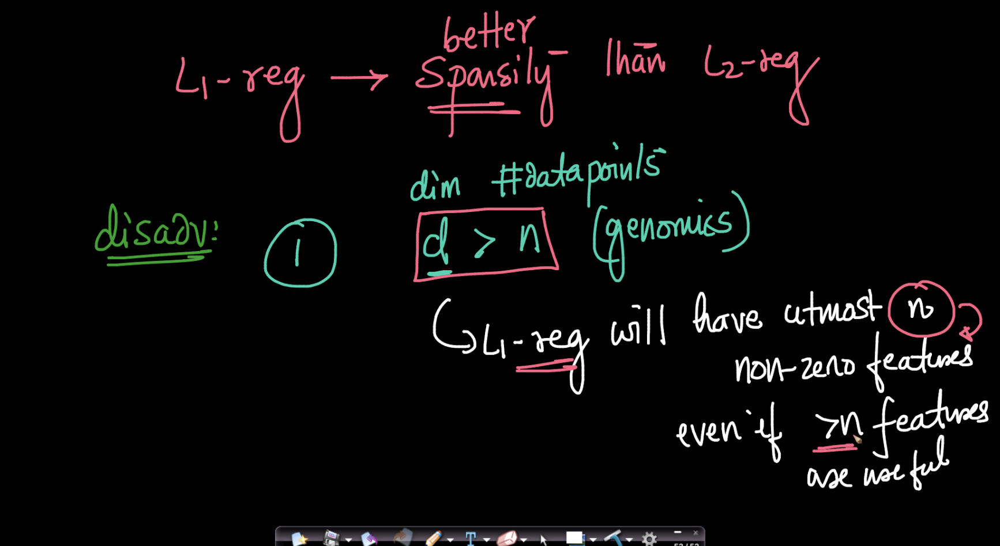

**Advantage**

We saw that **L1-reg. creates better sparsity than L2-regularization**

**Disadvantages**
1. Problem of saturation
    - If you have a dataset where number of dimensions is greater than number of datapoints (d>n) (Genemics - gene data)
    - L1 regularization will have utmost n non zero features even if > n features are useful
    - Proof. beyond the scope of class


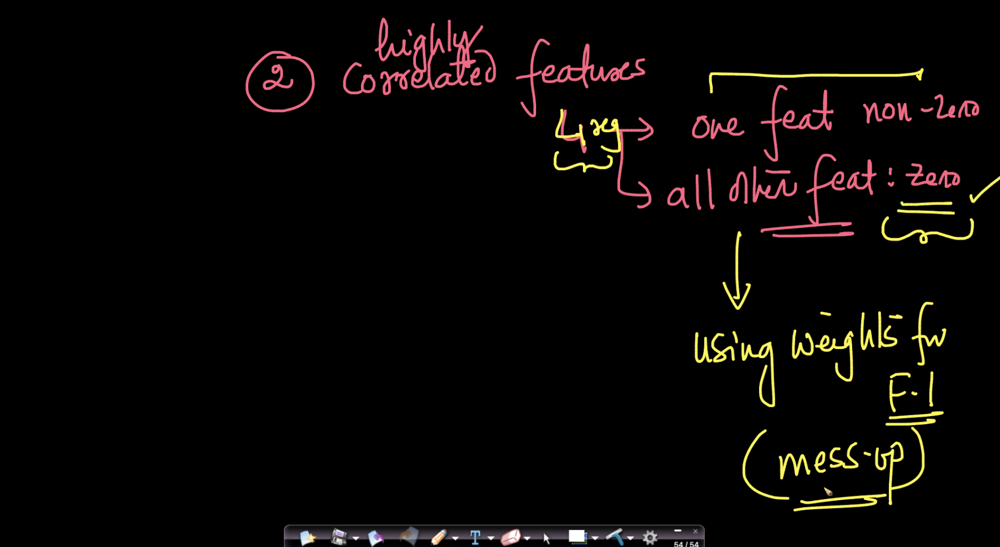

2. **Problem with correlation features**
    - If you have lot of highly correlated features
    - L1 regularization will make one feature as non zero
    - result all other features will become zero.
    - Which is correct in some cases but
    - Can mess up things when you are using weights for feature importance


### **How do we overcome these disadvantages? (Elastic net Regularization)**

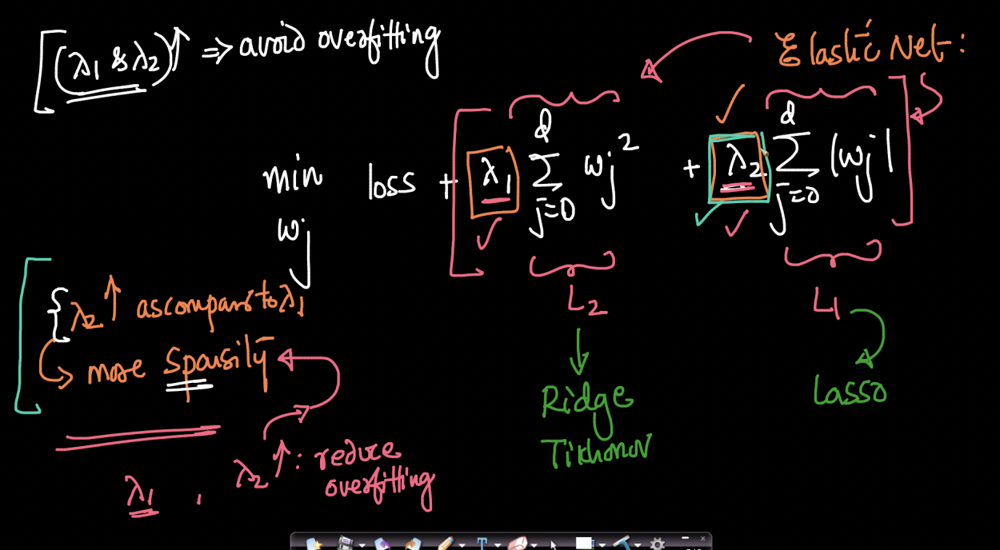

We use a combination of L1 and L2 regularization know as **Elastic Net Regularization**


- Since, we have both L2 and L1 regularization, it'll help in reducing overfitting as well as giving sparsity.
- If $λ_2$ is more compared to $λ_1$, more sparsity.

# **Hyperparameter**

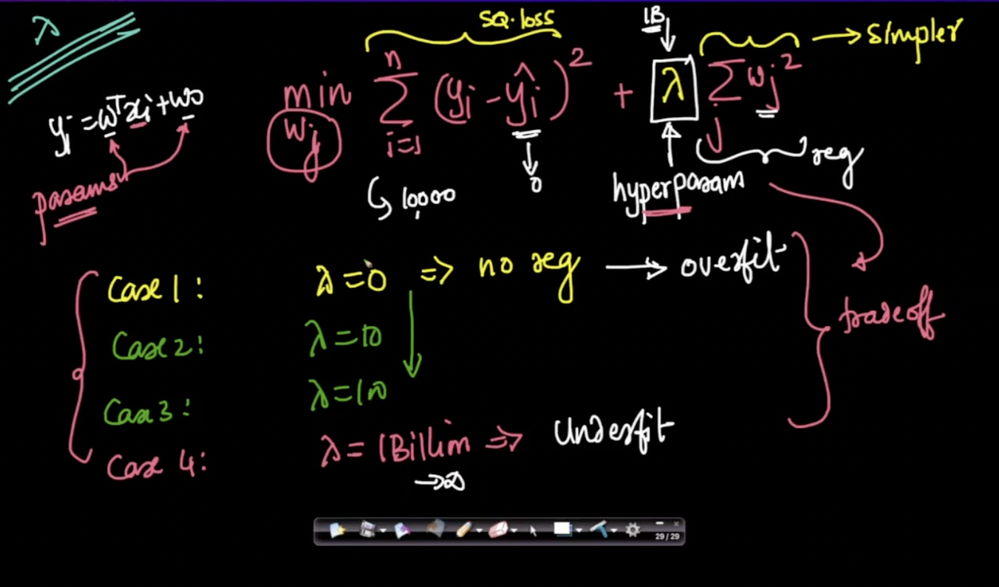

#### How does value of lambda impact the model?

Let's understand this with various cases

- Case1: $λ = 0$
  - There will be no regularization term.
  - Model will overfit.

- Case2: $λ = ∞$ (large +ve value)
  - As value of lambda is large, the magnitude of squared loss term is negligible.
  - Weightage of regularization term will increase
  - It'll try to push all the $w_j$'s to zero.
  - Model will underfit.


Lambda, here is called **hyperparamter** of the model.

Hyperparamters helps us do overfit- underfit tradeoff. By changing the lambda, we can control the regularization and hence overfit and underfit of the model.

As lambda increase, we tend from overfitting to underfitting.

**Note:**
When we define a model,
- the weights of the model becomes our parameters
- And the rest of the variables such as Regularization parameter becomes our Hyperparameter

#### Do we also optimize for λ?



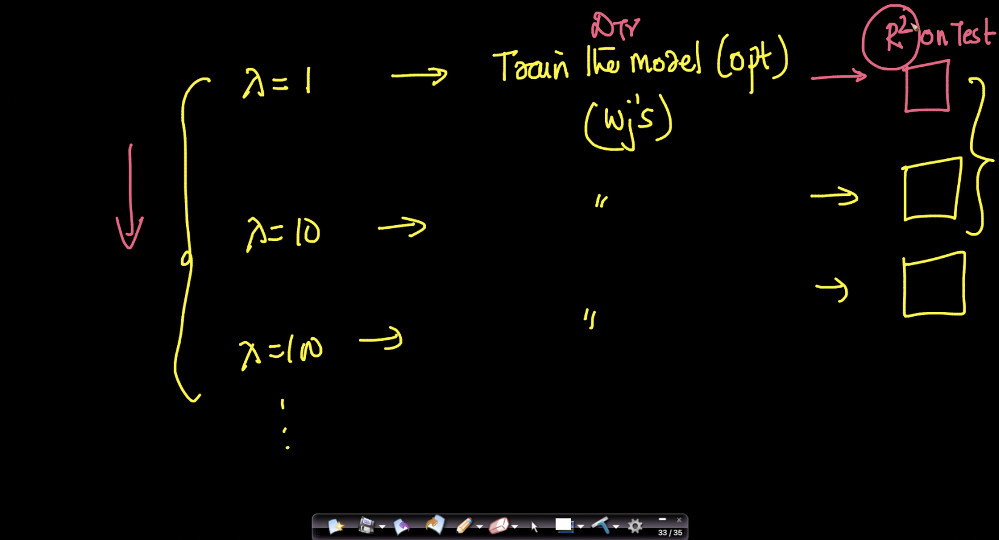

No. Purpose of λ is to control overfit underfit tradeoff.

In practice,
- We fix λ to small value (say λ =1 ) and train the model
- We get model weights and find performance on test data
- Then, we increase the value of λ (say λ = 10) and train the model
- We'll get different weights for new λ values and we find model performance on test set for new weights

**We try multiple value of lambda (λ) and pick the one which gives us lowest test error.**

It is the control level through which we can move from overfit to underfit manually and pick the model that's appropriate for us.


## **Question: Can we still use GD after adding regularization term?**

Yes. We can take the derivative easily.

Similarly, we use the hack for L1-reg. (discussed earlier)

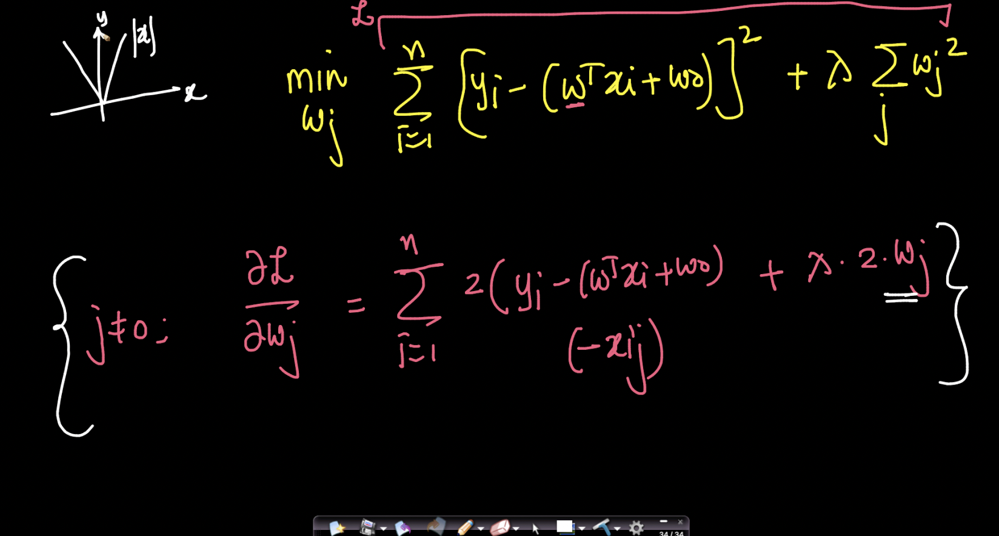

#### Let's use the code to create X and Y as we did in last lecture

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# lets first generate a dataset of 100 points this time
np.random.seed(1)
X = np.random.rand(100,1)
y = 0.7*(X**5) - \
    2.1*(X**4) + \
    2.3*(X**3) + \
    0.2*(X**2) + \
    0.3* X + \
    0.4*np.random.rand(100,1)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
# lets first generate a dataset of 100 points this time
np.random.seed(1)
X = np.random.rand(100,1)
y = 0.7*(X**5) - \
    2.1*(X**4) + \
    2.3*(X**3) + \
    0.2*(X**2) + \
    0.3* X + \
    0.4*np.random.rand(100,1)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# **Hyperparameter tuning**


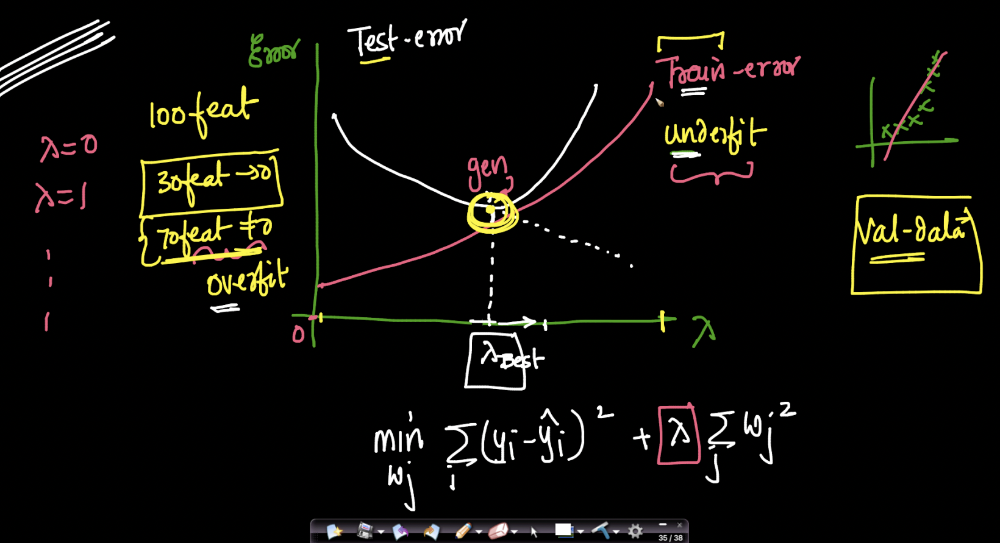

Let's draw a plot for **error vs lambda**

#### What will be the training error when lambda = 0 ? Minimum or maximum ?

Training error will be minimum when lambda = 0.

As lambda = 0,
- There is no regularization term
- Model will overfit
- Training error will be minimum.

#### Will the training error increase or decrease as lambda increases?  

As we increase λ,
- model tends from overfit to underfit
- train error will gradually increase.


#### Now, what happens to test error when we are overfitting?

When model is overfitting, test error tends to be higher.

As we keep increasing λ, the test error will come down till $λ$<sub>Tradeoff.

#### Will test error increase or decrease after λ<sub>tradeoff</sub> ?

As lambda increases, we are undefitting the model
- In underfitting
    - You data may be quadratic
    - but you'll be fitting linear function to it
    - test error will high

The test error will increase beyond λ tradeoff point.

**We take that lambda where the test error is minimum.** (λ<sub>Tradeoff</sub> = λ<sub>best</sub>)

- The model is neither overfitting nor underfitting at $λ_{best}$

- In practice
    - We keep changing the lambda
    - plot the train and test error
    - pick the lambda with mimimum test error.

This lambda will give us best generalized model.

And, the practice of trying multiple values of lambda to find best model is called **hyperparameter tuning**






# Cross validation


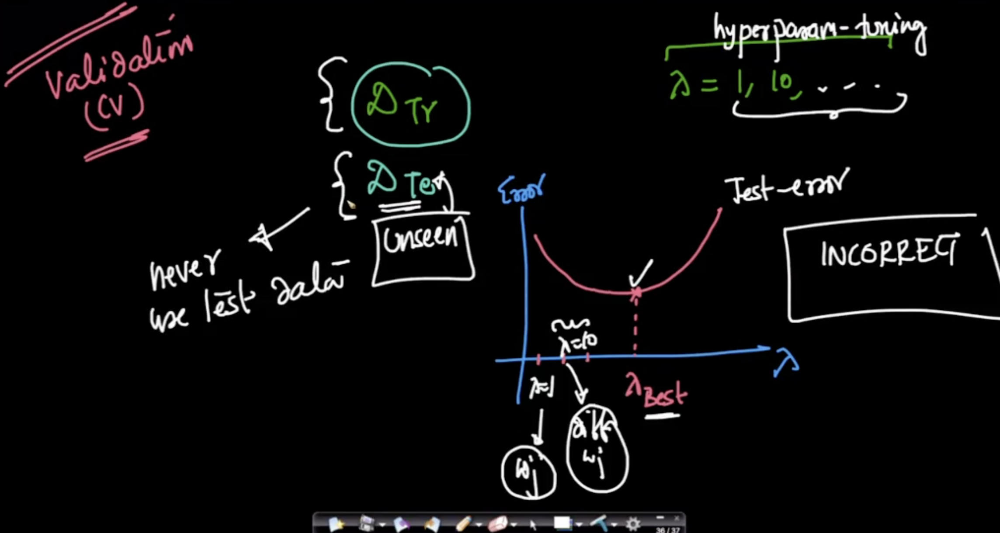

We train the model using training data $D_{tr}$ and use the test data $D_{te}$ to do hyperparameter tuning

- We plot the test error and select the best lambda having minimum test error.

#### What is the issue with the approach?

There is a fundamental flaw with this approach.

- Hyperparameter tuning is part of training process
- We are doing hyperparameter tuning using the test error
- But we should never use test data for training purposes. It is supposed to be unseen data.

**We should never had used test data to determine the best model.**

**USING test data to find $λ_{BEST}$ is not correct**






### **How do we solve this issue ?**




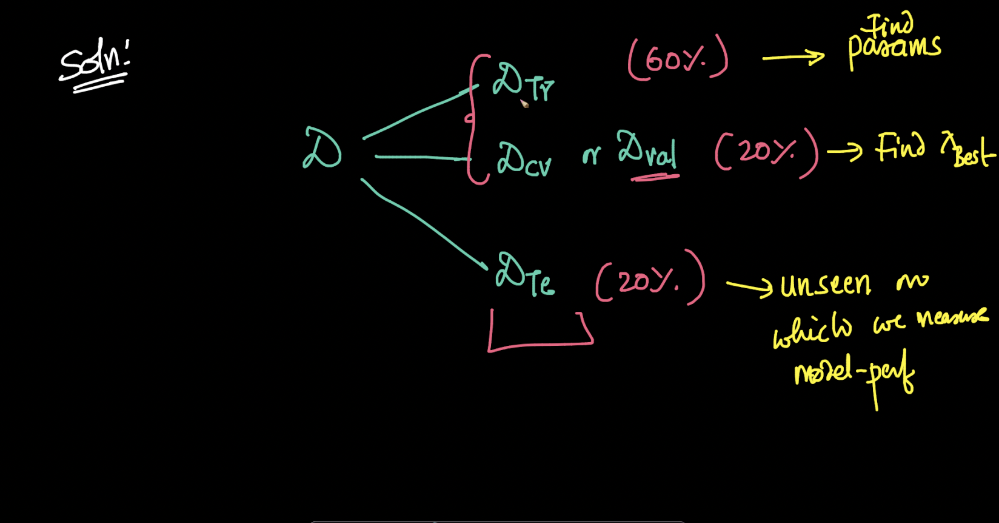

Instead of breaking up data into train and test, we break it up into 3 parts
- $D_{tr}$ Training data (60%)
- $D_{cv}$ or $D_{val}$ validation data (20%)
- $D_{te}$ Test data (20%)

Typically,
- The purpose of training data is to find model parameter
- We will use cross validation to find $λ_{Best}$
- Test data is used as sunseen data on which we measure model performance.

#### What are the steps for model building?

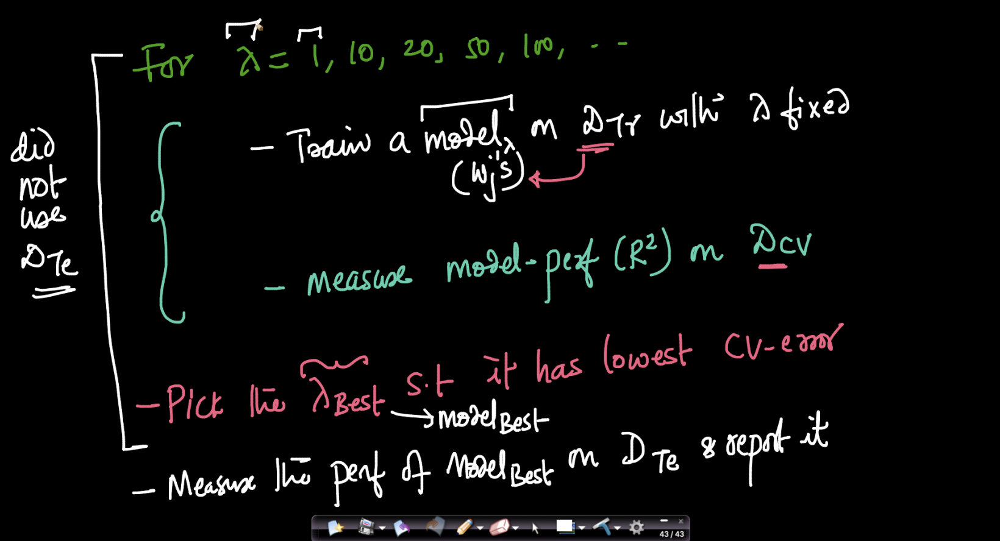

The steps for model building will be as follows:

1. For various values of lambda
    - we train the model on training data for a specific lambda
    - measure the model performance on cross validation data (not test data)

2. Pick the best lambda using the lowest cross validation error

3. Measure the performance of the model (using best model) on test data.


Notice that, we did not use test data for picking the best model.

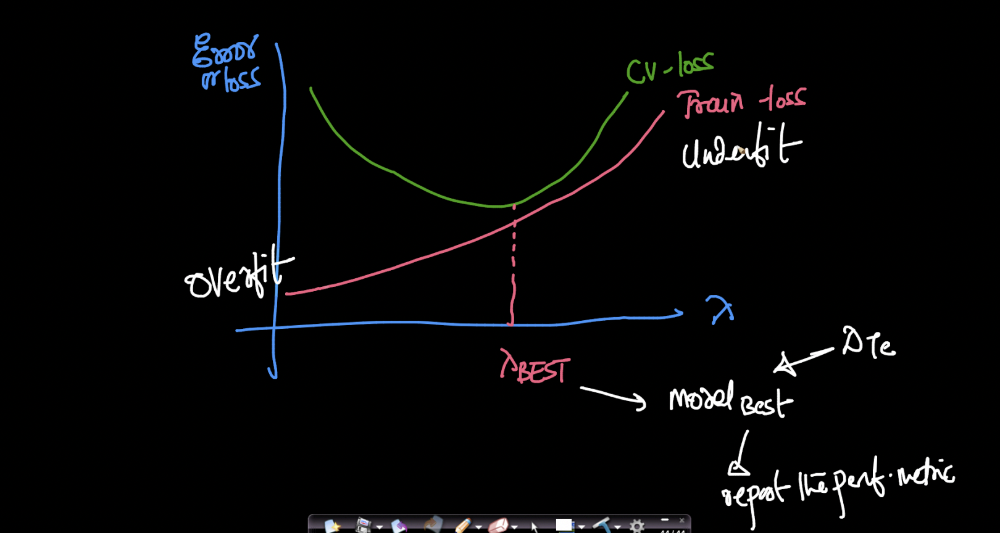

Similarly, we plot Error vs lambda

- We plot the values of CV-loss and Train loss
- We pick the best lambda having minimum cv- error
- Using the best model, we report the performance metric on test data.

#### Splitting the data into train, cv, test

In [ ]:
X.shape,y.shape

((100, 1), (100, 1))

In [ ]:
from sklearn.model_selection import train_test_split
#0.6, 0.2, 0.2 split
X_tr_cv, X_test, y_tr_cv, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_tr_cv, y_tr_cv, test_size=0.25,random_state=1)

#### Visualizing data

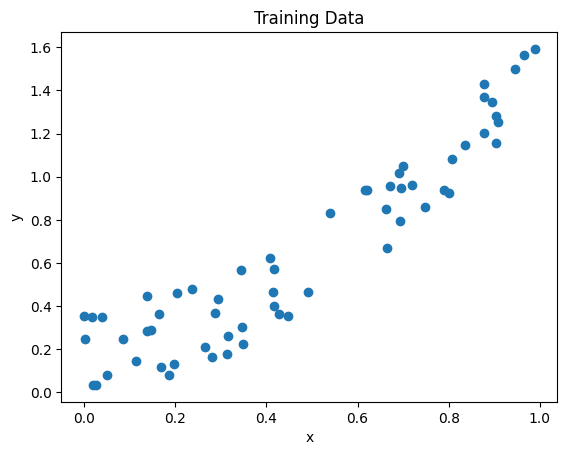

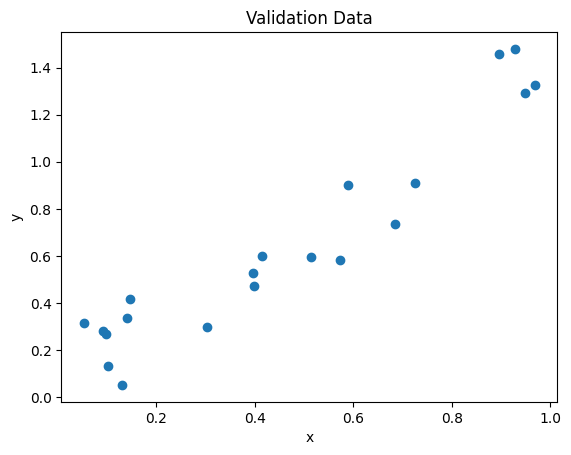

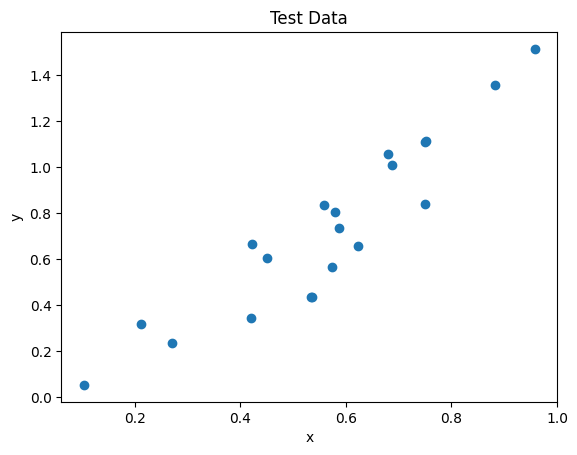

In [ ]:
fig = plt.figure()
plt.scatter(X_train, y_train)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Training Data")
plt.show()

fig = plt.figure()
plt.scatter(X_val, y_val)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Validation Data")
plt.show()

fig = plt.figure()
plt.scatter(X_test, y_test)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Test Data")
plt.show()

#### Implementing models

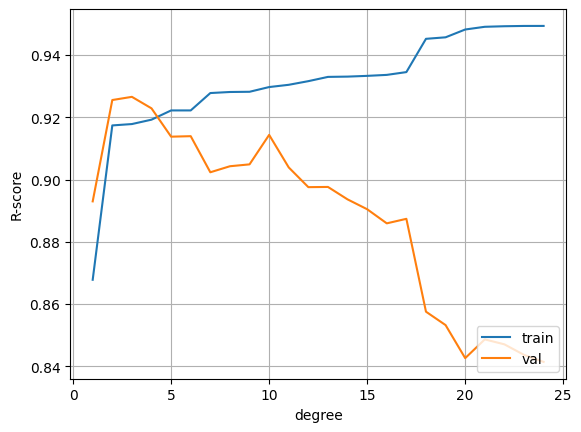

In [ ]:
# Train and Validatation without hyper param tuning. Just by controlling the degree
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
max_degree = 25 # max polynomial degree
train_scores = []
val_scores = []
scaler = StandardScaler()
for degree in range(1, max_degree):
    polyreg_scaled = make_pipeline(PolynomialFeatures(degree), scaler, LinearRegression())
    polyreg_scaled.fit(X_train, y_train)
    train_score = polyreg_scaled.score(X_train, y_train)
    val_score = polyreg_scaled.score(X_val, y_val)
    train_scores.append(train_score)
    val_scores.append(val_score)
plt.figure()
plt.plot(list(range(1, 25)), train_scores, label="train")
plt.plot(list(range(1, 25)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("degree")
plt.ylabel("R-score")
plt.grid()
plt.show()



# **K - fold CV**

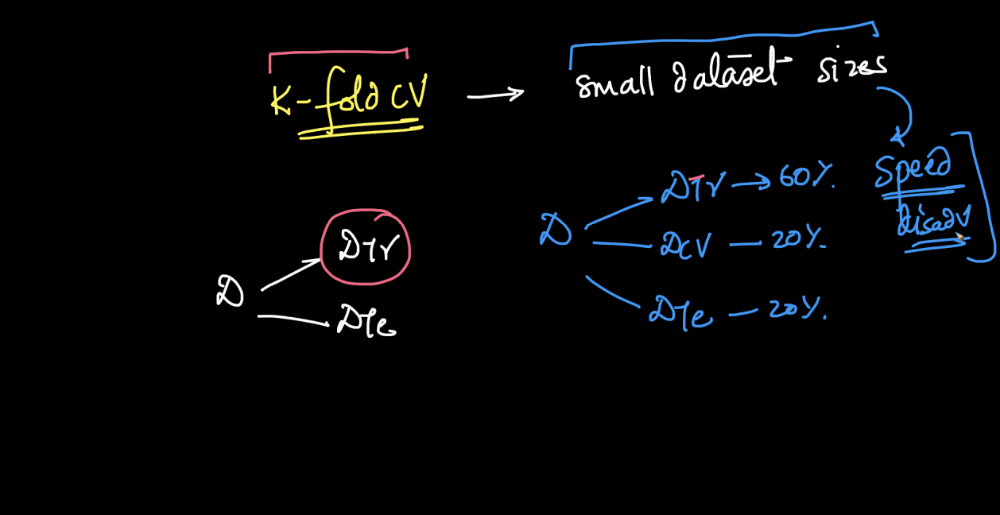

Consider a case where we have small dataset.

If we split the data in 3 parts (train, val, test), we won't have much data left to train on.

#### How to do validation on small datasets?

We use a technique called k-fold cross validation.

The training set is split into k smaller sets (other approaches are described below, but generally follow the same principles). The following procedure is followed for each of the k “folds”:

1. A model is trained using  of the folds as training data;
2. The resulting model is validated on the remaining part of the data (i.e., used as a validation set to compute a performance).

The performance measure reported by k-fold cross-validation is then the average of the values computed in the loop.

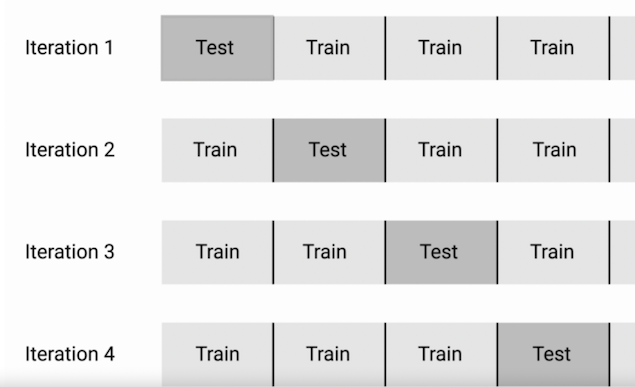

#### What are the pros?

- Helps preventing overfitting to any subset of the "development" dataset.
- Doesn't waste too much data - major advantage in problems such where the number of samples is very small.

#### What are the cons?
It can be computationally expensive

For **small datasets**, where extra computational burden isn't a big deal, you should run cross-validation.
For **larger datasets**, a single validation set is sufficient. Your code will run faster, and you may have enough data that there's little need to re-use some of it for holdout.

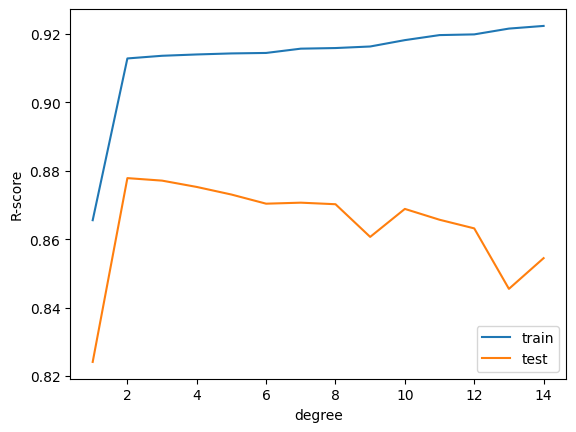

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=10)

from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

degrees = 15 # number of data-points
train_scores = []
test_scores = []

for degree in range(1, degrees):
    fold_train_scores = []
    fold_test_scores = []

    for train_index, test_index in kf.split(X): #iterating through the K-folds

        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        polyreg_scaled = make_pipeline(PolynomialFeatures(degree), scaler, LinearRegression())
        polyreg_scaled.fit(X_train, y_train) #training model

        train_score = polyreg_scaled.score(X_train, y_train)
        test_score = polyreg_scaled.score(X_test, y_test)

        fold_train_scores.append(train_score)
        fold_test_scores.append(test_score)

    train_score = np.mean(fold_train_scores)
    test_score = np.mean(fold_test_scores)

    train_scores.append(train_score)
    test_scores.append(test_score)

plt.figure()
plt.plot(list(range(1, 15)), train_scores, label="train")
plt.plot(list(range(1, 15)), test_scores, label="test")
plt.legend(loc='lower right')
plt.xlabel("degree")
plt.ylabel("R-score")
plt.show()

# Business Case

You are a Data Scientist at **Airtel**, and you need to analyze on some features of Customer Service
- To predict whether a Customer retains and uses the Airtel Services ($y=0$) or Churns to a new Competetive Telecom Company ($y=1$)






  <center><img src="https://drive.google.com/uc?id=1QxWuFOSbyFRo3HZY27G_z8khCp8SFw5o" width="900" height="500"> </center>

Lets Load the data

In [ ]:
#Churn prediction in telecom.
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
!gdown 1uUt7uL-VuF_5cpodYRiriEwhsldeEp3m

Downloading...
From: https://drive.google.com/uc?id=1uUt7uL-VuF_5cpodYRiriEwhsldeEp3m
To: /content/churn_logistic.csv
100% 494k/494k [00:00<00:00, 96.5MB/s]


In [ ]:
import pandas as pd
churn = pd.read_csv("churn_logistic.csv")
churn.head()

,Account Length,VMail Message,Day Mins,Eve Mins,Night Mins,Intl Mins,CustServ Calls,Intl Plan,VMail Plan,Day Calls,...,Eve Calls,Eve Charge,Night Calls,Night Charge,Intl Calls,Intl Charge,State,Area Code,Phone,Churn
0,128,25,265.1,197.4,244.7,10.0,1,0,1,110,...,99,16.78,91,11.01,3,2.70,KS,415,382-4657,0
1,107,26,161.6,195.5,254.4,13.7,1,0,1,123,...,103,16.62,103,11.45,3,3.70,OH,415,371-7191,0
2,137,0,243.4,121.2,162.6,12.2,0,0,0,114,...,110,10.30,104,7.32,5,3.29,NJ,415,358-1921,0
3,84,0,299.4,61.9,196.9,6.6,2,1,0,71,...,88,5.26,89,8.86,7,1.78,OH,408,375-9999,0
4,75,0,166.7,148.3,186.9,10.1,3,1,0,113,...,122,12.61,121,8.41,3,2.73,OK,415,330-6626,0


**Data Description**
<center>

| Records | Features |
| :-- | :-- |
| 5700 | 21 |


| Id | Features | Description |
| :-- | :--| :--|
|01| **state** | 2-letter code of the US state of customer residence|
|02| **account_length** | Number of months the customer has been with the current telco provider |
|03|**area_code**|string="area_code_AAA" where AAA = 3 digit area code|
|04|**intl_plan**|The customer has international plan|
|05|**vmail_plan**| The customer has voice mail plan|
|06|**vmail_messages**|Number of voice-mail messages|
|07|**day_mins**|Total minutes of day calls|
|08|**day_calls**|Total no of day calls|
|09|**day_charge**|Total charge of day calls|
|10|**eve_mins**|Total minutes of evening calls|
|11|**eve_calls**|Total no of evening calls|
|12|**eve_charge**|Total charge of evening calls|
|13|**night_mins**|Total minutes of night calls|
|14|**night_calls**|Total no of night calls|
|15|**night_charge**|Total charge of night calls|
|16|**intl_mins**|Total minutes of international calls|
|17|**intl_calls**|Total no of international calls|
|18|**intl_charge**|Total charge of international calls|
|19|**customer_service_calls**|Number of calls to customer service|
|20|**phone**|10 digit number|
|21|**churn**|Customer churn - target variable|

Lets see the number of samples when $y=0$ and $y=1$

In [ ]:
churn["Churn"].value_counts()

0    2850
1    2850
Name: Churn, dtype: int64

**Observe**

The samples for both the values of $y$ are same
- Showing that the data is balanced or have equal number of samples for both the cases



# Introduction to Logistic Regression

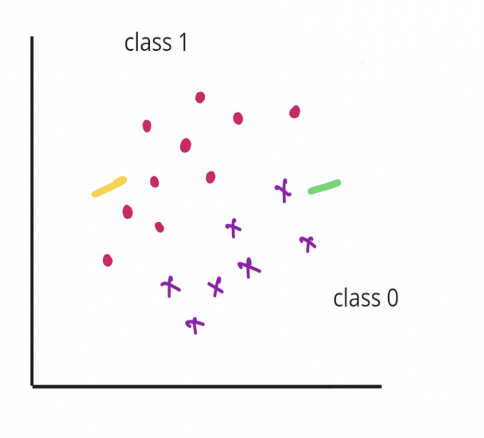

#### Will Linear Regression Work for Churn Prediction ?
Ans: No, since now the problem is to classify the data into Churn or Not-Churn

- Also Linear Regression has $\hat{y} = w^Tx_i+w_0$
 - which has range  ($-∞,∞$)
 - But $y$ has only 2 values i.e 0 and 1  

<br>

Since $y$ can have only two values {$0,1$},
- hence the Problem becomes a Binary Classification one

With this, we introduce Logistic Regression  
- A simple Linear model
- Which is used to handle Classification problem

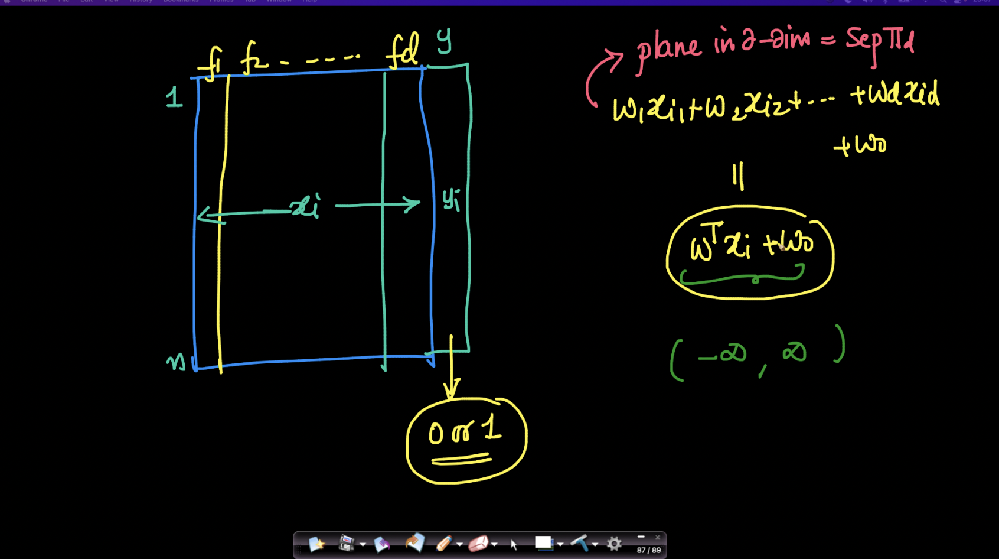


#### How does the data looks like ?

Ans: for ith sample in n samples, $x_i$ have d features and $y_i$ is either 0 or 1

#### What do we want to achieve ?
Ans: We want a hyperplane in d-dim that separates the data into 0 and 1
- Hyperplane $π$: $w_1x_{i1}+w_2x_{i2}+w_3x_{i3}+.....+w_dx_{id}+ w_0 $
- Simplifed to:  $\pi = w^Tx_i+w_0$.

<br>

#### How is Logistic Regression different from Linear Regression ?
The basic idea behind logisitic regression is to:
- Builts a hyperplane that separates the data
- rather than follow the pattern of the data as done by linear Regression.

<br>

#### Can you see a problem between $w^Tx_i+w_0$ and $y_i$ ?
- The range of the values of this function is ($-∞,∞$)
- But our output $y_i$ has only 2 values i.e 0 and 1

Hence we need of a function that maps values of $w^Tx_i+w_0$ to {0,1}
